# Машинное обучение в задачах кредитного скоринга

```Тема``` - Машинное обучение в задачах кредитного скоринга

```Автор``` - Леонид Борисович Кулыгин

```Научный руководитель``` - Резо Артёмович Аллахвердов

## Введение 

```Цель``` - Исследовать применение инструментов Машинного обучения в задачах кредитного скоринга на выбранном датасете. 

```Промежуточная цель``` - представить разные модели Машинного обучения для решения различных задач внутри банковского учреждения 

```Бизнес задача``` - варириуется от ситуации внутри банка. 

Например,
- необходимо дать как можно больше кредитов, минимизируя потери банка
- необходимо дать кредиты только хорошим клиентам
- и т. д.

```ML задача``` - задача бинарной классификации

```Актуальность``` - Инструментарий машинного обучения поможет выявить клиентов, которые не смогут выплатить кредит или наоборот показать самых кредитоспособных клиентов, на основе прошлых данных. Задачи зависят от конкретных запросов бизнеса. Это все позволяет бизнесу сократить свои расходы или повысить выручку, так или иначе это все влияет на итоговую прибыль. 

**Система кредитного скоринга** произошло от слова 'score', что означает счет или подсчет очков. Оно применяется для оценки платежеспособности заемщика. 

```Задачи:```
1. Найти данные для решения задачи кредитного скоринга
2. Проанализировать датасет
3. Выстроить гипотезы для EDA
4. Предобработать датасет 
5. Подобрать список моделей для решения задачи кредитного скоринга
6. Подобрать список метрик для решения задачи кредитного скоринга
7. Выявить лучшие модели для бизнес задачи
8. Проанализировать пере- или недообучение 
9. Улучшить наилучшую модель
11. Выявить незначимые признаки 
12. Подвести итог работы модели

https://www.kaggle.com/datasets/nikhil1e9/loan-default/data

## Библиотеки

In [81]:
# работа с данными 
import numpy as np
import pandas as pd

# работа с графиками
import matplotlib.pyplot as plt 
import seaborn as sns
import graphviz
from sklearn.tree import plot_tree, export_graphviz

# работа с выборкой 
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from imblearn.over_sampling import SMOTE, SMOTENC

# метрики
from sklearn.metrics import roc_auc_score, accuracy_score,  precision_score, recall_score, f1_score

#модели
from sklearn.linear_model import LogisticRegression, PassiveAggressiveClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis, LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, CategoricalNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb 

# обработка предупреждений
import warnings
warnings.filterwarnings('ignore')

## Описание набора Данных и решаемую задачу 

Этот набор данных был взят из конкурса Coursera по прогнозированию дефолта по кредитам, что предоставляет возможность решить одну из наиболее актуальных в отрасли проблем машинного обучения с помощью уникального набора данных.

Сам датасет загружен в ресурс kaggle 

https://www.kaggle.com/datasets/nikhil1e9/loan-default/data

### Описание данных

```LoanID``` - id клиента 

```Age``` - возраст клиента 

```Income``` - годовой доход клиента

```LoanAmount``` - сумма кредита 

```CreditScore``` - кредитный рейтинг клиента 

```MonthsEmployed``` - стаж работы клиента в месяцах 

```NumCreditLines``` - количество открытых кредитных линий 

```InterestRate``` - процентная ставка кредита 

```LoanTerm``` - срок кредита 

```DTIRatio``` - коэффициент кредита на доход 

```Education``` - образование клиента 

```EmploymentType``` - статус работы ()

```MaritalStatus``` - семейное положение 

```HasMortgage``` - есть ипотека

```HasDependents``` - есть люди, которых финансово обеспечивает клиент

```LoanPurpose``` - цель кредита

```HasCoSigner``` - есть созаемщик у клиента 

```Default``` - Целевая переменная: клиент обанкротился (1) или не обанкротился (0)

### Загрузка датасета

In [2]:
data = pd.read_csv(r'data\bank.csv', sep=',')
data.head()

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,I38PQUQS96,56,85994,50587,520,80,4,15.23,36,0.44,Bachelor's,Full-time,Divorced,Yes,Yes,Other,Yes,0
1,HPSK72WA7R,69,50432,124440,458,15,1,4.81,60,0.68,Master's,Full-time,Married,No,No,Other,Yes,0
2,C1OZ6DPJ8Y,46,84208,129188,451,26,3,21.17,24,0.31,Master's,Unemployed,Divorced,Yes,Yes,Auto,No,1
3,V2KKSFM3UN,32,31713,44799,743,0,3,7.07,24,0.23,High School,Full-time,Married,No,No,Business,No,0
4,EY08JDHTZP,60,20437,9139,633,8,4,6.51,48,0.73,Bachelor's,Unemployed,Divorced,No,Yes,Auto,No,0


## Предварительный анализ

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255347 entries, 0 to 255346
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   LoanID          255347 non-null  object 
 1   Age             255347 non-null  int64  
 2   Income          255347 non-null  int64  
 3   LoanAmount      255347 non-null  int64  
 4   CreditScore     255347 non-null  int64  
 5   MonthsEmployed  255347 non-null  int64  
 6   NumCreditLines  255347 non-null  int64  
 7   InterestRate    255347 non-null  float64
 8   LoanTerm        255347 non-null  int64  
 9   DTIRatio        255347 non-null  float64
 10  Education       255347 non-null  object 
 11  EmploymentType  255347 non-null  object 
 12  MaritalStatus   255347 non-null  object 
 13  HasMortgage     255347 non-null  object 
 14  HasDependents   255347 non-null  object 
 15  LoanPurpose     255347 non-null  object 
 16  HasCoSigner     255347 non-null  object 
 17  Default   

### Очистка данных 

#### Пропуски в данных 

<Axes: >

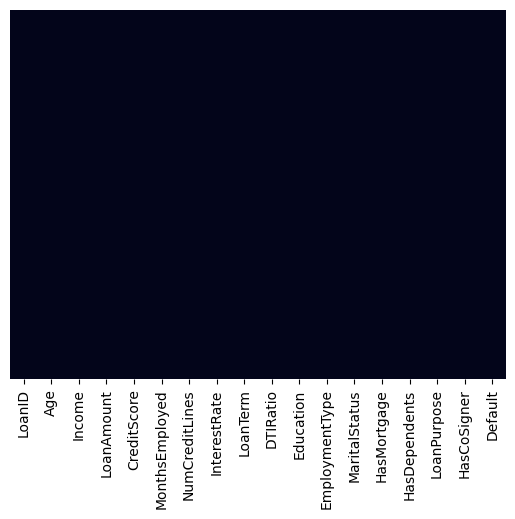

In [4]:
sns.heatmap(data.isna(), cbar=False, yticklabels=False)

In [5]:
data.isna().any().any()

False

**Вывод: Нет нулевых значений**

#### Статистика столбцов 

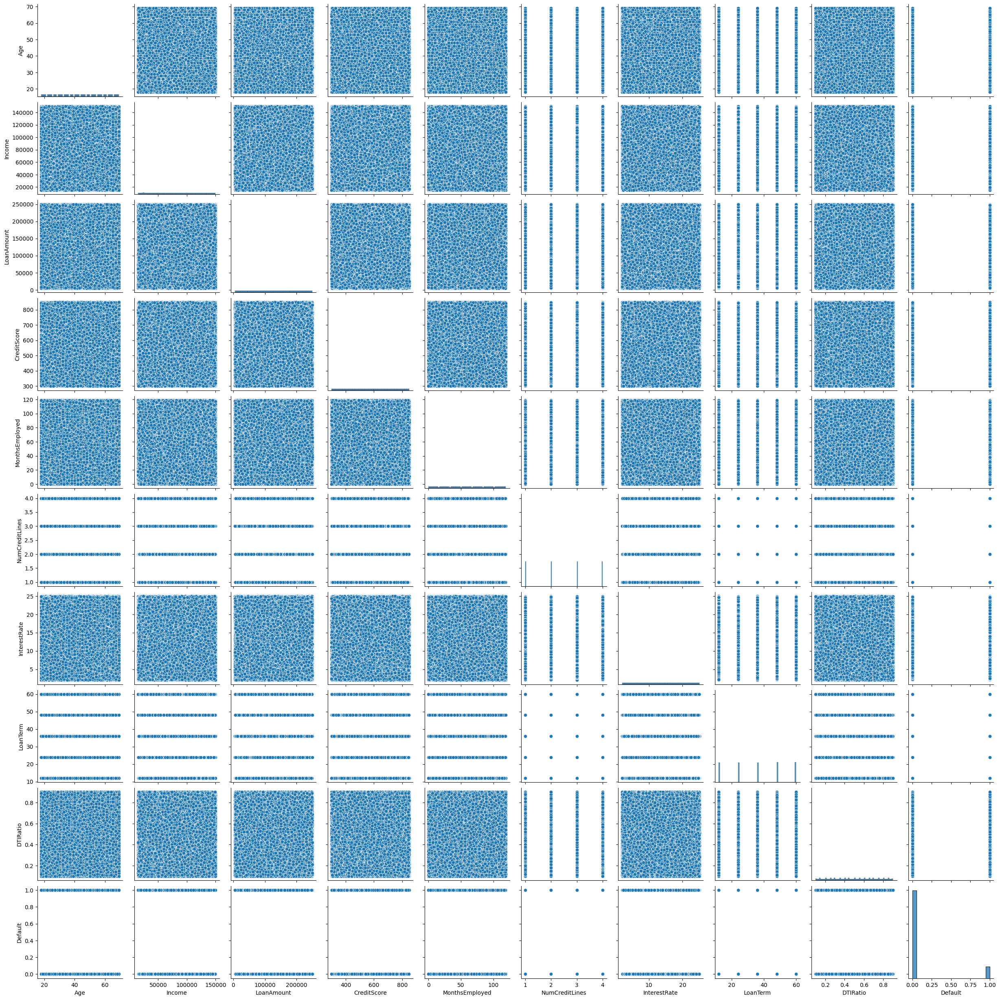

In [6]:
sns.pairplot(data)

Данный график может сообщить о дисбалансе классов и о проблеме, что признаки распределены равномерно для каждого класса.

Рассмотрим наш датасет более точно, для точных выводов

##### Числовые признака

In [7]:
data.select_dtypes(exclude=object).drop(columns=['Default']).describe()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio
count,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000
mean,43.498306,82499.304597,127578.865512,574.264346,59.541976,2.501036,13.492773,36.025894,0.500212
std,14.990258,38963.013729,70840.706142,158.903867,34.643376,1.117018,6.636443,16.969330,0.230917
min,18.000000,15000.000000,5000.000000,300.000000,0.000000,1.000000,2.000000,12.000000,0.100000
25%,31.000000,48825.500000,66156.000000,437.000000,30.000000,2.000000,7.770000,24.000000,0.300000
50%,43.000000,82466.000000,127556.000000,574.000000,60.000000,2.000000,13.460000,36.000000,0.500000
75%,56.000000,116219.000000,188985.000000,712.000000,90.000000,3.000000,19.250000,48.000000,0.700000
max,69.000000,149999.000000,249999.000000,849.000000,119.000000,4.000000,25.000000,60.000000,0.900000


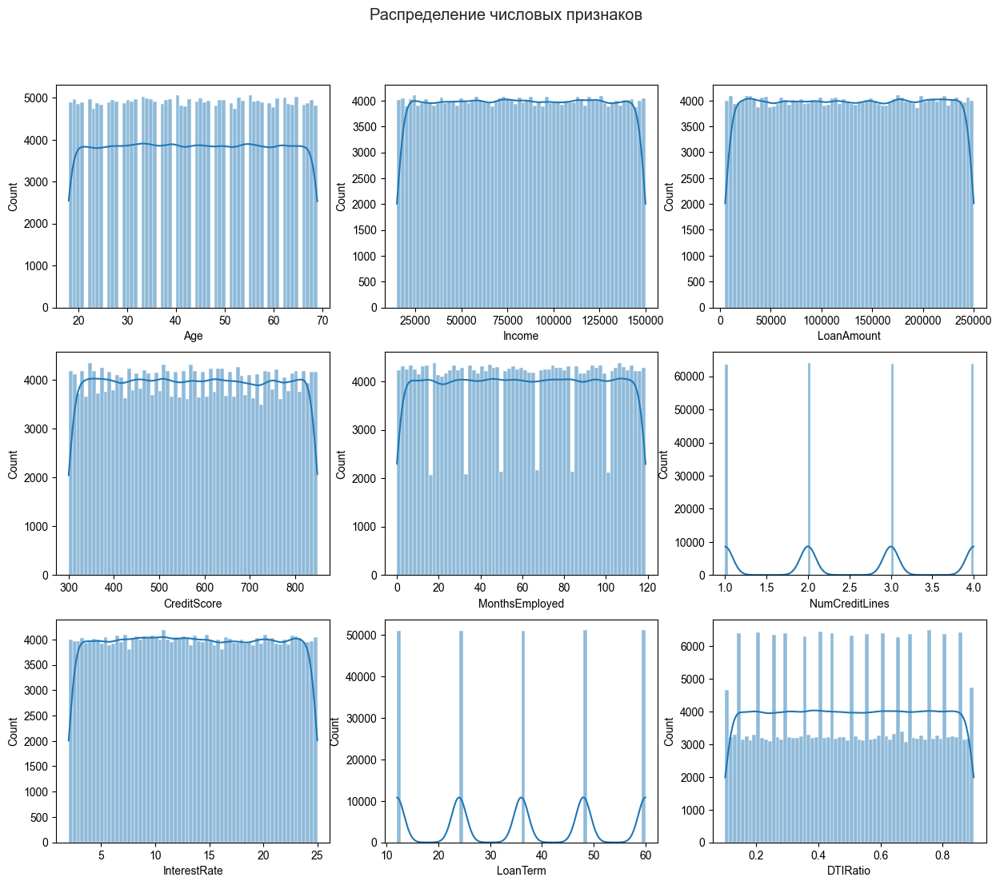

In [8]:
fig, axes = plt.subplots(3,3,figsize=(15,12))
sns.set()

plt.suptitle('Распределение числовых признаков')
plt.subplots_adjust(top=0.9)


sns.histplot(data, x='Age', ax=axes[0][0], kde=True)
sns.histplot(data, x='Income', ax=axes[0][1], kde=True)
sns.histplot(data, x='LoanAmount', ax=axes[0][2], kde=True)
sns.histplot(data, x='CreditScore', ax=axes[1][0], kde=True)
sns.histplot(data, x='MonthsEmployed', ax=axes[1][1], kde=True)
sns.histplot(data, x='NumCreditLines', ax=axes[1][2], kde=True)
sns.histplot(data, x='InterestRate', ax=axes[2][0], kde=True)
sns.histplot(data, x='LoanTerm', ax=axes[2][1], kde=True)
sns.histplot(data, x='DTIRatio', ax=axes[2][2], kde=True)


plt.show()

##### Выводы:
- В среднем кредит берут на 60 месяцев
- 

##### Категориальные признаки

In [9]:
data.select_dtypes(include=object).describe()

,LoanID,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
count,255347,255347,255347,255347,255347,255347,255347,255347
unique,255347,4,4,3,2,2,5,2
top,I38PQUQS96,Bachelor's,Part-time,Married,Yes,Yes,Business,Yes
freq,1,64366,64161,85302,127677,127742,51298,127701


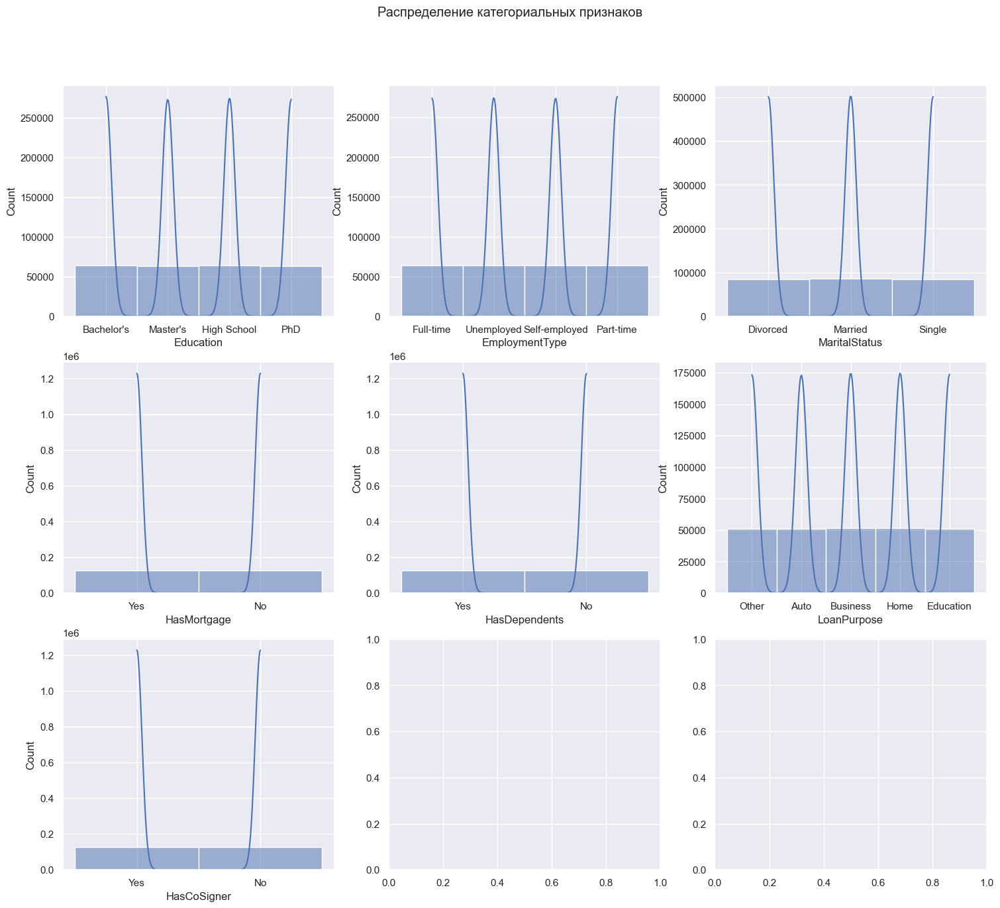

In [10]:
fig, axes = plt.subplots(3,3,figsize=(18,15))
sns.set()

plt.suptitle('Распределение категориальных признаков')
plt.subplots_adjust(top=0.9)


sns.histplot(data, x='Education', ax=axes[0][0], kde=True)
sns.histplot(data, x='EmploymentType', ax=axes[0][1], kde=True)
sns.histplot(data, x='MaritalStatus', ax=axes[0][2], kde=True)
sns.histplot(data, x='HasMortgage', ax=axes[1][0], kde=True)
sns.histplot(data, x='HasDependents', ax=axes[1][1], kde=True)
sns.histplot(data, x='LoanPurpose', ax=axes[1][2], kde=True)
sns.histplot(data, x='HasCoSigner', ax=axes[2][0], kde=True)



plt.show()

##### Выводы:
**Столбцы для удаления или очистки**
- LoanId - не несет под собой информативные свойства
- LoanPurpose - у большиства целью для кредита бизнес, авто или дом, что является другим отличным банковским продуктом от потребительского кредита. 

**Информативные выводы**
- У данных равномерное распределение всех категориальных признаков

In [11]:
data = data.drop(columns=['LoanID'])

In [12]:
data = data[data['LoanPurpose']=='Other']
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50914 entries, 0 to 255345
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             50914 non-null  int64  
 1   Income          50914 non-null  int64  
 2   LoanAmount      50914 non-null  int64  
 3   CreditScore     50914 non-null  int64  
 4   MonthsEmployed  50914 non-null  int64  
 5   NumCreditLines  50914 non-null  int64  
 6   InterestRate    50914 non-null  float64
 7   LoanTerm        50914 non-null  int64  
 8   DTIRatio        50914 non-null  float64
 9   Education       50914 non-null  object 
 10  EmploymentType  50914 non-null  object 
 11  MaritalStatus   50914 non-null  object 
 12  HasMortgage     50914 non-null  object 
 13  HasDependents   50914 non-null  object 
 14  LoanPurpose     50914 non-null  object 
 15  HasCoSigner     50914 non-null  object 
 16  Default         50914 non-null  int64  
dtypes: float64(2), int64(8), object(7)


##### Распределение целевой переменной 

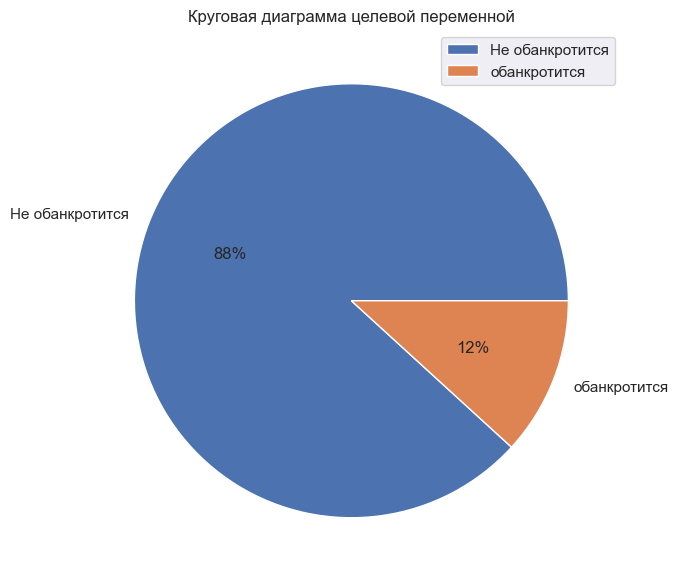

In [13]:
labels = ['Не обанкротится','обанкротится']
value = data.Default.value_counts().values

plt.figure(figsize=(7,4))
plt.title('Круговая диаграмма целевой переменной')
plt.pie(x = value, labels=labels, autopct='%.0f%%')
plt.subplots_adjust(top=1.5)
plt.legend()
plt.show()

###### Выводы 
- Наблюдается дисбаланс классов
  - Дисбаланс классов приводит к снижению качества модели, так как происходит смещение в сторону предсказания большего класса и не учитывает меньший класс. 

В данном датасете присутсвует серьезная **проблема**, а именно **дисбаланс классов**.

Перечислим **основные причины** почему его стоит учитывать:

1. Высокий риск неусточивости модели к изменениям распределения данных
2. Неадекватные значения метрик
3. Переобучение на более представленном классе
и т. д. 

На сегодня есть два подхода для решения этой задачи: на уровнях алгоритмов МО и на уровне данных.

В данной примере я воспользуюсь решением **на уровне данных**, которые могут включать в себя:
1. Метод балансировки классов путем увеличения количества образцов в меньшем классе
    - Например алгоритм SMOTE создает новые образцы путем комбинации ближайших соседей, а затем добавляет эти образцы в выборку
2. Метод уменьшение выборки, приравнивая размеры наибольшего класса к наименьшому
   - Случайно выбирать объекты из наибольшего класса, удаляя наиболее похожие элементы
3. Метод взвешивания классов
   - давать наибольшие коэффициенты для наименьшего класса 

Воспользуемся алгоритмом SMOTE

In [14]:
X, y = data.drop(columns=['Default']).values, data['Default'].values

In [15]:
sm = SMOTENC(#sampling_strategy = 0.5,
	    random_state=42,
	    k_neighbors=5, categorical_features=[9,10,11,12,13,14,15])

In [16]:
Xim, Yim = sm.fit_resample(X,y)

In [17]:
dataim = pd.DataFrame(Xim)
dataim['Default'] = Yim
dataim.columns = data.columns

Отрисуем круговую диаграмму целевой переменной 

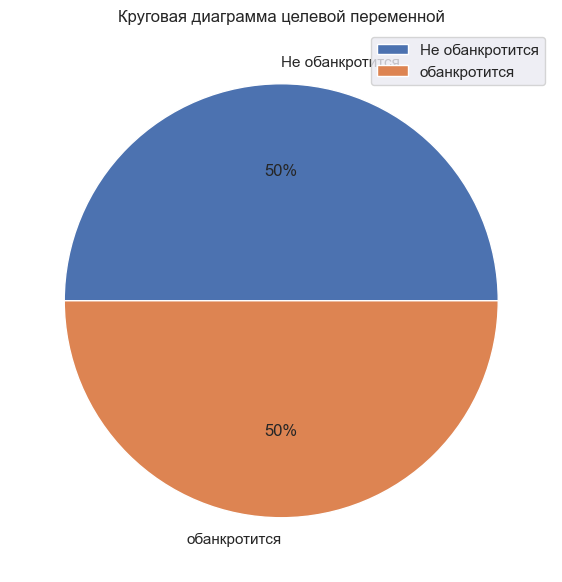

In [18]:
labels = ['Не обанкротится','обанкротится']
value = dataim.Default.value_counts().values

plt.figure(figsize=(7,4))
plt.title('Круговая диаграмма целевой переменной')
plt.pie(x = value, labels=labels, autopct='%.0f%%')
plt.subplots_adjust(top=1.5)
plt.legend()
plt.show()

In [19]:
dataim[['Age',	'Income',	'LoanAmount',	'CreditScore',	'MonthsEmployed',	'NumCreditLines',	'InterestRate',	'LoanTerm',	'DTIRatio']] = dataim[['Age',	'Income',	'LoanAmount',	'CreditScore',	'MonthsEmployed',	'NumCreditLines',	'InterestRate',	'LoanTerm',	'DTIRatio']].astype('float64')
dataim.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89824 entries, 0 to 89823
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             89824 non-null  float64
 1   Income          89824 non-null  float64
 2   LoanAmount      89824 non-null  float64
 3   CreditScore     89824 non-null  float64
 4   MonthsEmployed  89824 non-null  float64
 5   NumCreditLines  89824 non-null  float64
 6   InterestRate    89824 non-null  float64
 7   LoanTerm        89824 non-null  float64
 8   DTIRatio        89824 non-null  float64
 9   Education       89824 non-null  object 
 10  EmploymentType  89824 non-null  object 
 11  MaritalStatus   89824 non-null  object 
 12  HasMortgage     89824 non-null  object 
 13  HasDependents   89824 non-null  object 
 14  LoanPurpose     89824 non-null  object 
 15  HasCoSigner     89824 non-null  object 
 16  Default         89824 non-null  int64  
dtypes: float64(9), int64(1), object

Посмотрим на распределения признаков после преобразования 

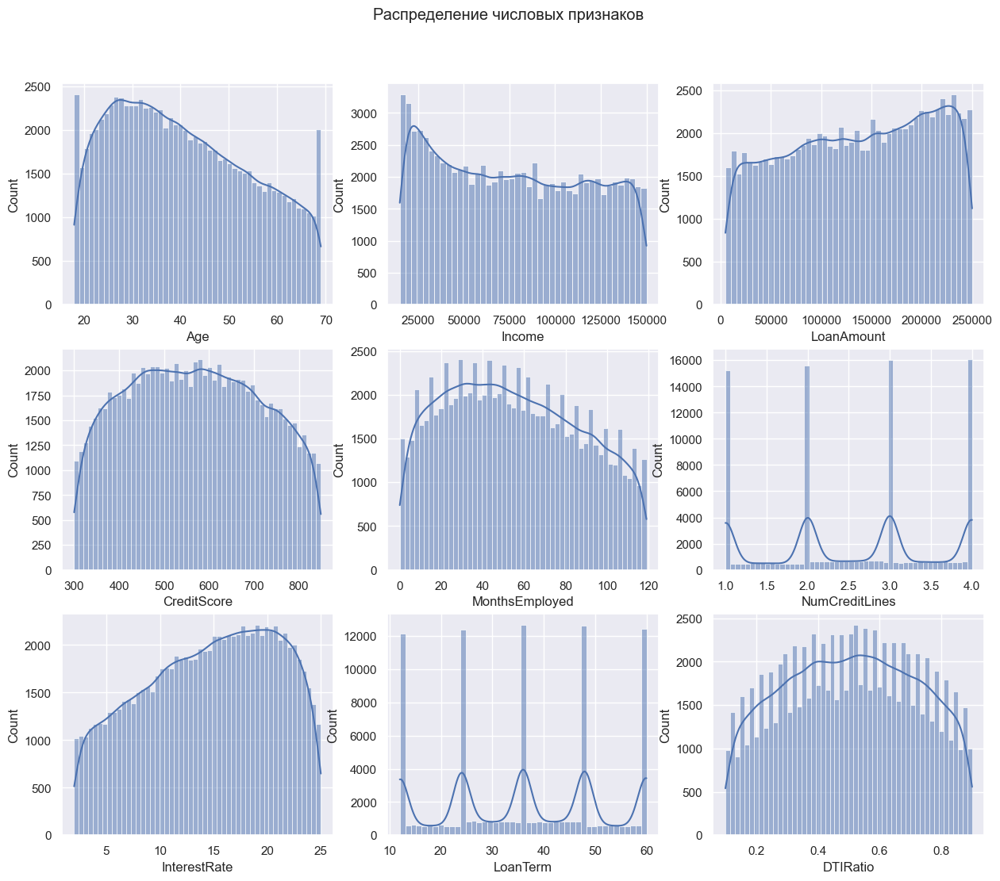

In [20]:
fig, axes = plt.subplots(3,3,figsize=(15,12))
sns.set()

plt.suptitle('Распределение числовых признаков')
plt.subplots_adjust(top=0.9)


sns.histplot(dataim, x='Age', ax=axes[0][0], kde=True)
sns.histplot(dataim, x='Income', ax=axes[0][1], kde=True)
sns.histplot(dataim, x='LoanAmount', ax=axes[0][2], kde=True)
sns.histplot(dataim, x='CreditScore', ax=axes[1][0], kde=True)
sns.histplot(dataim, x='MonthsEmployed', ax=axes[1][1], kde=True)
sns.histplot(dataim, x='NumCreditLines', ax=axes[1][2], kde=True)
sns.histplot(dataim, x='InterestRate', ax=axes[2][0], kde=True)
sns.histplot(dataim, x='LoanTerm', ax=axes[2][1], kde=True)
sns.histplot(dataim, x='DTIRatio', ax=axes[2][2], kde=True)


plt.show()

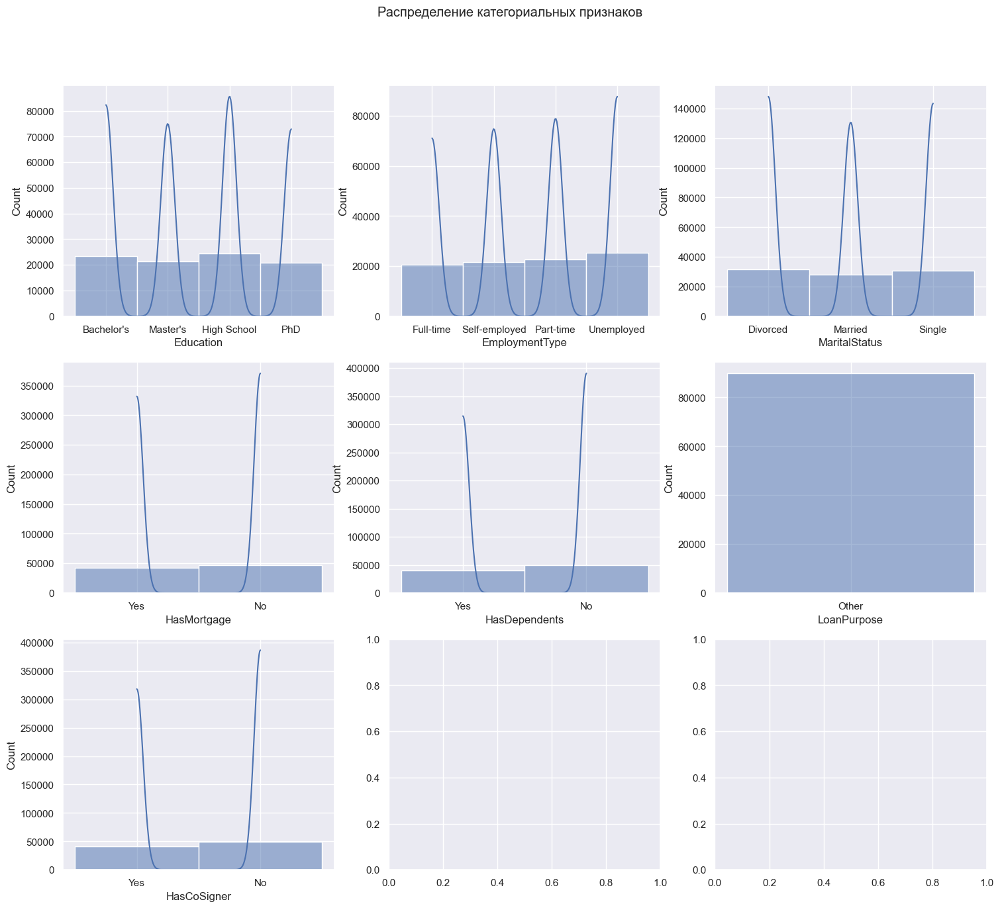

In [21]:
fig, axes = plt.subplots(3,3,figsize=(18,15))
sns.set()

plt.suptitle('Распределение категориальных признаков')
plt.subplots_adjust(top=0.9)


sns.histplot(dataim, x='Education', ax=axes[0][0], kde=True)
sns.histplot(dataim, x='EmploymentType', ax=axes[0][1], kde=True)
sns.histplot(dataim, x='MaritalStatus', ax=axes[0][2], kde=True)
sns.histplot(dataim, x='HasMortgage', ax=axes[1][0], kde=True)
sns.histplot(dataim, x='HasDependents', ax=axes[1][1], kde=True)
sns.histplot(dataim, x='LoanPurpose', ax=axes[1][2], kde=True)
sns.histplot(dataim, x='HasCoSigner', ax=axes[2][0], kde=True)



plt.show()

Удаляем столбец LoanPurpose, так как он больше не несет информативную функцию 

In [22]:
dataim = dataim.drop(columns=['LoanPurpose'])

Вывод:

После проведения алгоритма для избавления дисбаланса классов можно наблюдать **изменения в распределении признаков**. Это позволит лучше оценить датасет, а также выстроить гипотезы для EDA

## EDA

***Гипотезы***

- Возраст хороших заемщиков выше, чем у плохих
- У плохих заемщиков низкий уровень доходов
- Низкая степень образования больше у плохих заемщиков
- Низкий коэффициент долг/зарплату у плохих заемщиков
- Низкая ставка по кредиту у хороших заемщиков
- Чем выше количество месяцев, тем хуже заемщик
- Кредитный рейтинг напрямую связан с вероятностью дефолта
- Если есть созаёмщик тем ниже вероятность дефолта
- Хорошие заемщики женаты
- У хороших клиентов есть имущество
- У плохих клиентов больше кредитных линий
- Если у клиента полный рабочий день, тем ниже вероятность дефолта 

Возраст хороших заемщиков выше чем у плохих

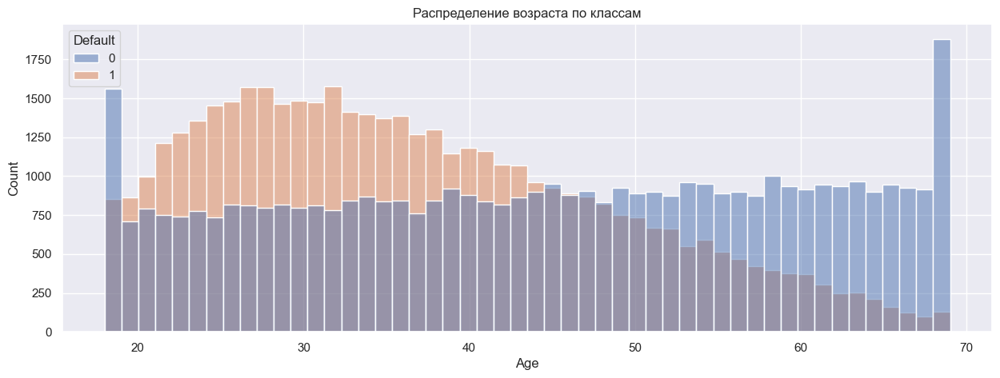

In [23]:
plt.figure(figsize=(15,5))
plt.title('Распределение возраста по классам')
sns.histplot(data=dataim, x="Age", hue="Default")
plt.show()


In [24]:
print(f'средений Возраст у плохих заемщиков - {data['Age'][data['Default']==1].mean()}')
print(f'средений Возраст у хороших заемщиков {data['Age'][data['Default']==0].mean()}')

средений Возраст у плохих заемщиков - 36.764078640453185
средений Возраст у хороших заемщиков 44.5442198076238


In [25]:
print(f'медиана возраст у плохих заемщиков - {np.median(data['Age'][data['Default']==1])}')
print(f'медиана возраст у хороших заемщиков {np.median(data['Age'][data['Default']==0])}')

медиана возраст у плохих заемщиков - 34.0
медиана возраст у хороших заемщиков 45.0


**У хороших заемщиков выше возраст, чем у плохих** 

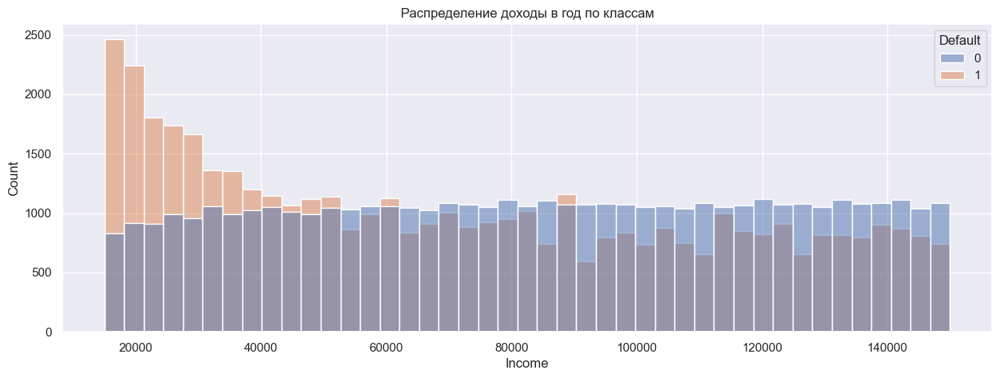

In [26]:
plt.figure(figsize=(15,5))
plt.title('Распределение доходы в год по классам')
sns.histplot(data=dataim, x="Income", hue="Default")
plt.show()

In [27]:
print(f'средний уровень доходов у плохих заемщиков - {data['Income'][data['Default']==1].mean()}')
print(f'средний уровень доходов у хороших заемщиков {data['Income'][data['Default']==0].mean()}')

средний уровень доходов у плохих заемщиков - 71387.55764745086
средний уровень доходов у хороших заемщиков 83949.9540879943


In [28]:
print(f'медиана уровня доходов у плохих заемщиков - {np.median(data['Income'][data['Default']==1])}')
print(f'медиана уровня доходов у хороших заемщиков {np.median(data['Income'][data['Default']==0])}')

медиана уровня доходов у плохих заемщиков - 65909.5
медиана уровня доходов у хороших заемщиков 84312.5


**У хороших заемщиков выше доходы**

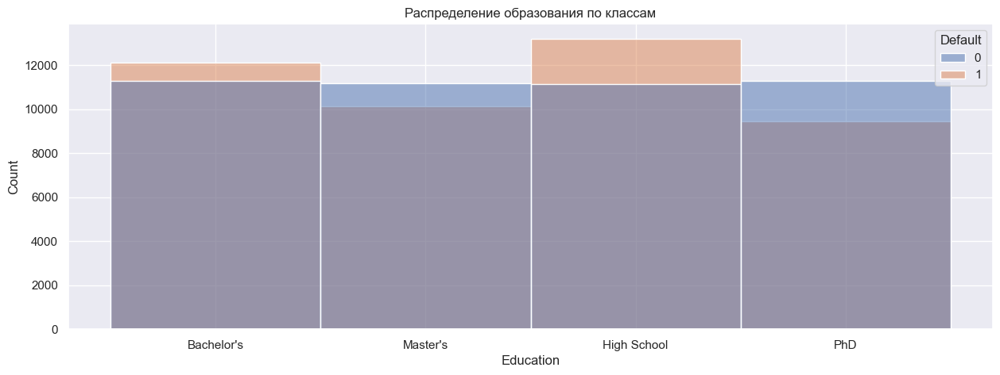

In [29]:
plt.figure(figsize=(15,5))
plt.title('Распределение образования по классам')
sns.histplot(data=dataim, x="Education", hue="Default")
plt.show()

**На графике видно, что у плохих заемщиков распространенная степень образование бакалавриат и старшая школа**

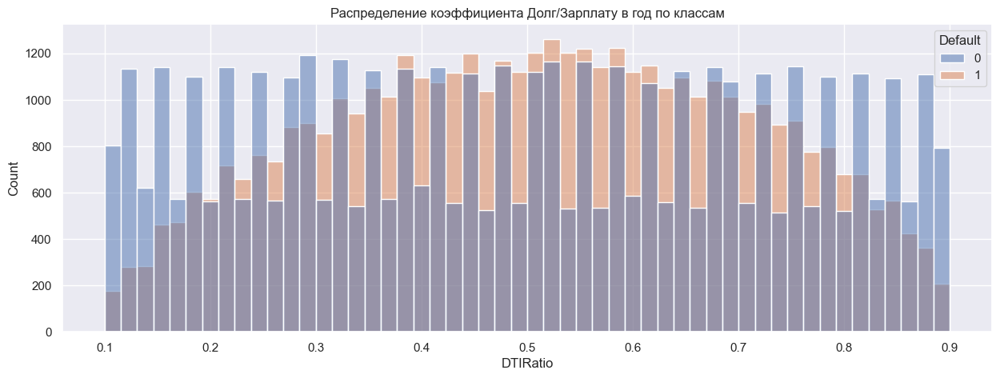

In [30]:
plt.figure(figsize=(15,5))
plt.title('Распределение коэффициента Долг/Зарплату в год по классам')
sns.histplot(data=dataim, x="DTIRatio", hue="Default")
plt.show()

In [31]:
print(f'средний у коэффициента Долг/Доходы в год у плохих заемщиков - {data['DTIRatio'][data['Default']==1].mean()}')
print(f'средний у коэффициента Долг/Доходы в год у хороших заемщиков {data['DTIRatio'][data['Default']==0].mean()}')

средний у коэффициента Долг/Доходы в год у плохих заемщиков - 0.5096451182939021
средний у коэффициента Долг/Доходы в год у хороших заемщиков 0.49711725151407204


In [32]:
print(f'медиана у коэффициента Долг/Доходы в год у плохих заемщиков - {np.median(data['DTIRatio'][data['Default']==1])}')
print(f'медиана у коэффициента Долг/Доходы в год у хороших заемщиков {np.median(data['DTIRatio'][data['Default']==0])}')

медиана у коэффициента Долг/Доходы в год у плохих заемщиков - 0.52
медиана у коэффициента Долг/Доходы в год у хороших заемщиков 0.5


**коэффициента Долг/Доходы в год примерно одинаковый как у плохих, так и у хороших**

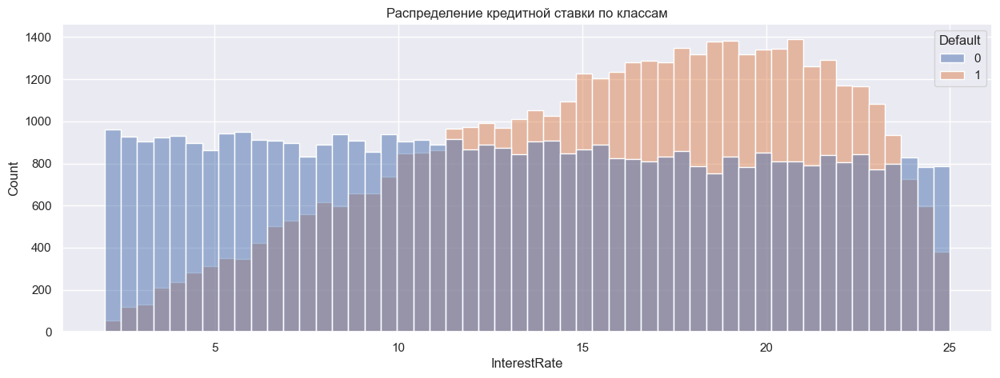

In [33]:
plt.figure(figsize=(15,5))
plt.title('Распределение кредитной ставки по классам')
sns.histplot(data=dataim, x="InterestRate", hue="Default")
plt.show()

In [34]:
print(f'средний кредитной ставки у плохих заемщиков - {data['InterestRate'][data['Default']==1].mean()}')
print(f'средний кредитной ставки у хороших заемщиков {data['InterestRate'][data['Default']==0].mean()}')

средний кредитной ставки у плохих заемщиков - 15.825106631122958
средний кредитной ставки у хороших заемщиков 13.164073076237978


In [35]:
print(f'медиана кредитной ставки у плохих заемщиков - {np.median(data['InterestRate'][data['Default']==1])}')
print(f'медиана кредитной ставки у хороших заемщиков {np.median(data['InterestRate'][data['Default']==0])}')

медиана кредитной ставки у плохих заемщиков - 16.81
медиана кредитной ставки у хороших заемщиков 12.96


**У хороших заемщиков ниже кредитная ставка**

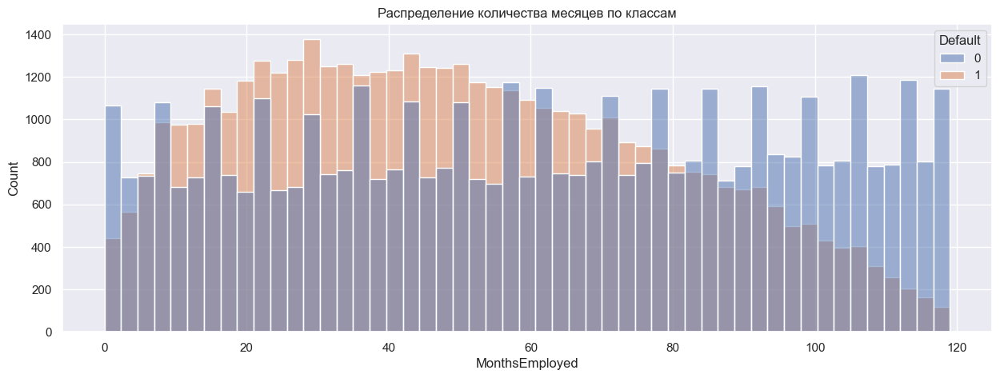

In [36]:
plt.figure(figsize=(15,5))
plt.title('Распределение количества месяцев по классам')
sns.histplot(data=dataim, x="MonthsEmployed", hue="Default")
plt.show()

In [37]:
print(f'средние количество месяцев у плохих заемщиков - {data['MonthsEmployed'][data['Default']==1].mean()}')
print(f'средние количество месяцев у хороших заемщиков {data['MonthsEmployed'][data['Default']==0].mean()}')

средние количество месяцев у плохих заемщиков - 50.284905031656116
средние количество месяцев у хороших заемщиков 60.76273601710011


In [38]:
print(f'медиана количества месяцев у плохих заемщиков - {np.median(data['MonthsEmployed'][data['Default']==1])}')
print(f'медиана количества месяцев у хороших заемщиков {np.median(data['MonthsEmployed'][data['Default']==0])}')

медиана количества месяцев у плохих заемщиков - 46.0
медиана количества месяцев у хороших заемщиков 62.0


**У плохих заемщиков меньше срок кредита**

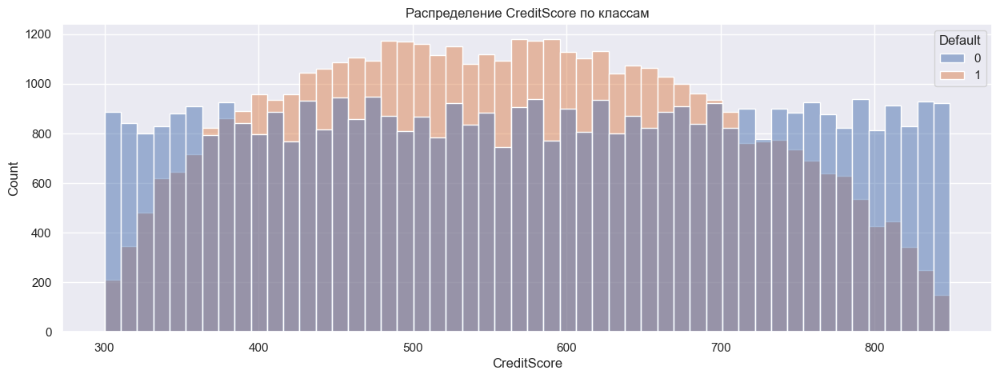

In [39]:
plt.figure(figsize=(15,5))
plt.title('Распределение CreditScore по классам')
sns.histplot(data=dataim, x="CreditScore", hue="Default")
plt.show()

In [40]:
print(f'средние CreditScore у плохих заемщиков - {data['CreditScore'][data['Default']==1].mean()}')
print(f'средние CreditScore у хороших заемщиков {data['CreditScore'][data['Default']==0].mean()}')

средние CreditScore у плохих заемщиков - 561.7447517494169
средние CreditScore у хороших заемщиков 576.1001514071963


In [41]:
print(f'медиана CreditScore у плохих заемщиков - {np.median(data['CreditScore'][data['Default']==1])}')
print(f'медиана CreditScore у хороших заемщиков {np.median(data['CreditScore'][data['Default']==0])}')

медиана CreditScore у плохих заемщиков - 557.0
медиана CreditScore у хороших заемщиков 577.0


**Кредитный рейтинг не отличается как у плохих, так и у хороших клиентов**

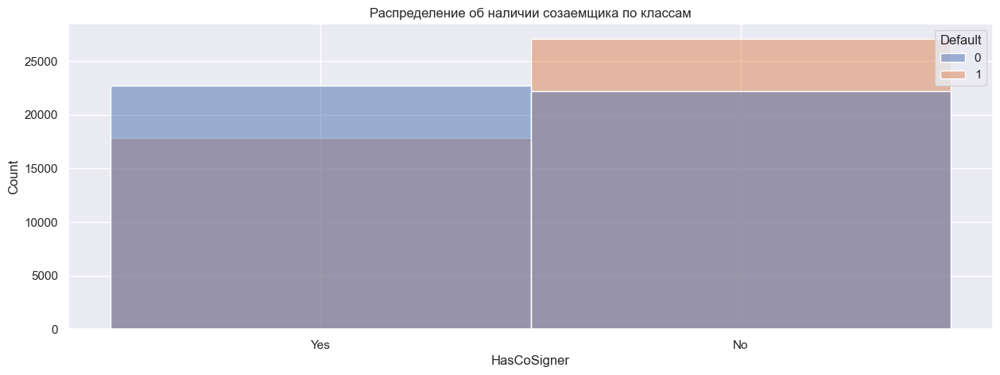

In [42]:
plt.figure(figsize=(15,5))
plt.title('Распределение об наличии созаемщика по классам')
sns.histplot(data=dataim, x="HasCoSigner", hue="Default")
plt.show()

**У хороших клиентов есть созаемщики**

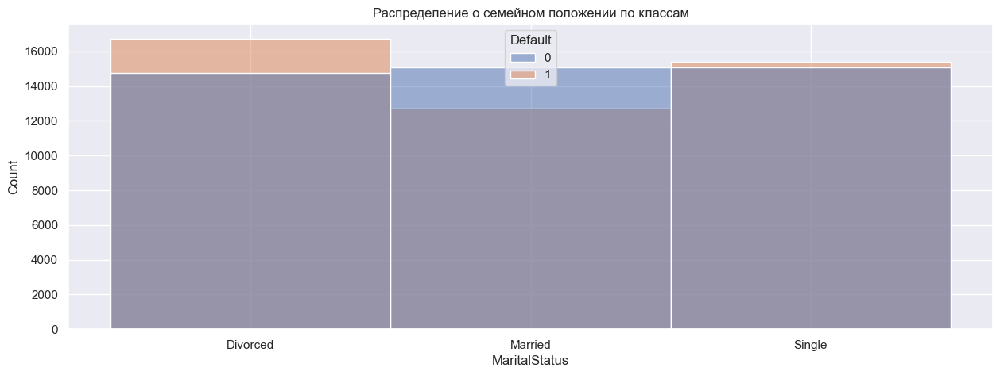

In [43]:
plt.figure(figsize=(15,5))
plt.title('Распределение о семейном положении по классам')
sns.histplot(data=dataim, x="MaritalStatus", hue="Default")
plt.show()

**Чаще всего хорошие клиенты женаты**

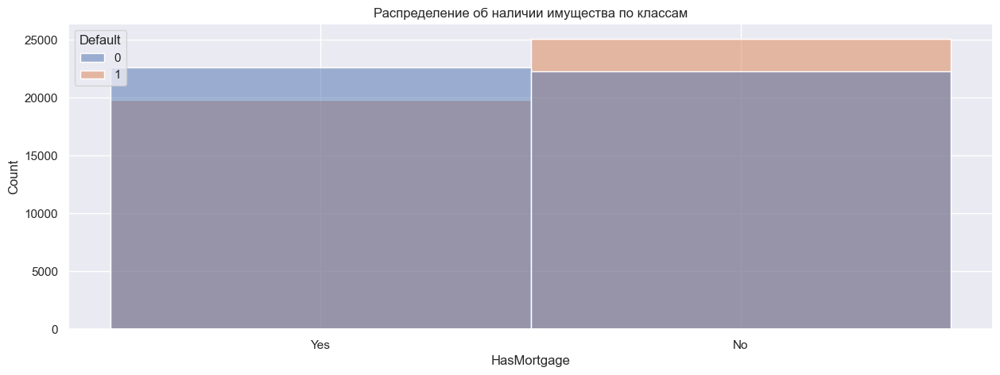

In [44]:
plt.figure(figsize=(15,5))
plt.title('Распределение об наличии имущества по классам')
sns.histplot(data=dataim, x="HasMortgage", hue="Default")
plt.show()

**У хороших заемщиков есть имущество**

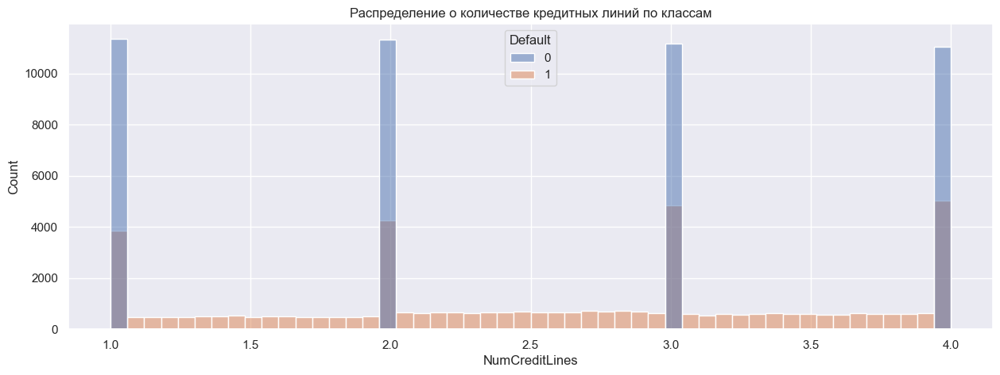

In [45]:
plt.figure(figsize=(15,5))
plt.title('Распределение о количестве кредитных линий по классам')
sns.histplot(data=dataim, x="NumCreditLines", hue="Default")
plt.show()

In [46]:
print(f'средние NumCreditLines у плохих заемщиков - {data['NumCreditLines'][data['Default']==1].mean()}')
print(f'средние NumCreditLines у хороших заемщиков {data['NumCreditLines'][data['Default']==0].mean()}')

средние NumCreditLines у плохих заемщиков - 2.5793068977007665
средние NumCreditLines у хороших заемщиков 2.4874198432490204


In [47]:
print(f'медиана NumCreditLines у плохих заемщиков - {np.median(data['NumCreditLines'][data['Default']==1])}')
print(f'медиана NumCreditLines у хороших заемщиков {np.median(data['NumCreditLines'][data['Default']==0])}')

медиана NumCreditLines у плохих заемщиков - 3.0
медиана NumCreditLines у хороших заемщиков 2.0


**У плохих клиентов больше кредитных линий**

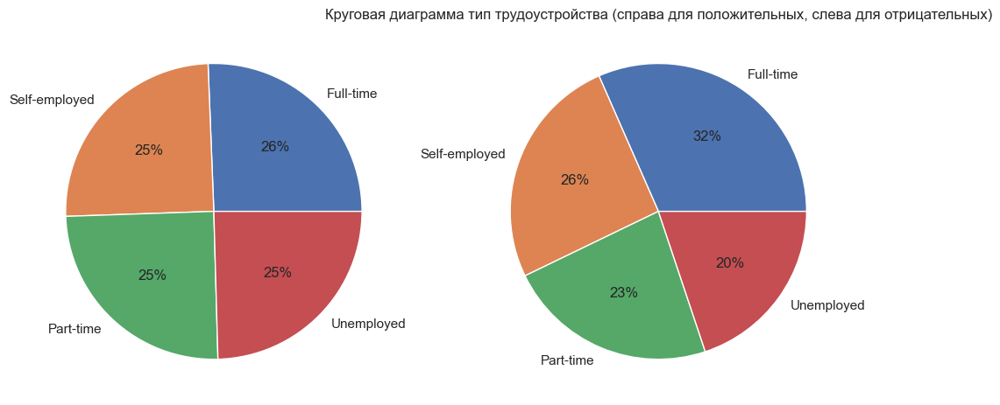

In [48]:
labels = ['Full-time', 'Self-employed', 'Part-time', 'Unemployed']
value1 = dataim[dataim['Default']==0].EmploymentType.value_counts().values
value2 = dataim[dataim['Default']==1].EmploymentType.value_counts().values

fig, axes = plt.subplots(1,2, figsize=(12,8))
# plt.title('Круговая диаграмма по типу трудоустройства для положительных клиентов')
plt.title('Круговая диаграмма тип трудоустройства (справа для положительных, слева для отрицательных)')
axes[0].pie(x = value1, labels=labels, autopct='%.0f%%')
axes[1].pie(x = value2, labels=labels, autopct='%.0f%%')

plt.subplots_adjust(top=10)
plt.show()

**Не работающие клиенты менее подвержены дефолту, чем рабочие**

Однако стоит заметить, что этим клиентам уже дали кредиты и мы знаем результаты, поэтому возможно результаты смещены. 

### Итоговые результаты EDA

1. У хороших заемщиков выше возраст, чем у плохих
2. У хороших заемщиков выше доходы
3. У плохих заемщиков распространенная степень образование бакалавриат и старшая школа
4. Коэффициента Долг/Доходы в год примерно одинаковый как у плохих, так и у хороших
5. У хороших заемщиков ниже кредитная ставка
6. У плохих заемщиков меньше срок кредита
7. Кредитный рейтинг не отличается как у плохих, так и у хороших клиентов
8. У хороших клиентов есть созаемщики
9. Чаще всего хорошие клиенты женаты
10. У хороших заемщиков есть имущество
11. У плохих клиентов больше кредитных линий
12. Не работающие клиенты менее подвержены дефолту, чем рабочие

**Вывод:**


Стоит обратить внимание, что EDA направлен в первую очередь на данные, которые имеются в датасете. К сожалению задачу нельзя решить в общем виде. Поэтому при внедрении модели необходимо постоянно наблюдать за данными и строить новые модели для стабильной работы кредитного скоринга. 

Для данного датасета имеются выводы описанные блоком выше

## Разделение датасета

Создание дамми переменных 

In [49]:
dataimd = pd.get_dummies(dataim, drop_first=True) 
dataimd.head()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Default,...,Education_Master's,Education_PhD,EmploymentType_Part-time,EmploymentType_Self-employed,EmploymentType_Unemployed,MaritalStatus_Married,MaritalStatus_Single,HasMortgage_Yes,HasDependents_Yes,HasCoSigner_Yes
0,56.0,85994.0,50587.0,520.0,80.0,4.0,15.23,36.0,0.44,0,...,False,False,False,False,False,False,False,True,True,True
1,69.0,50432.0,124440.0,458.0,15.0,1.0,4.81,60.0,0.68,0,...,True,False,False,False,False,True,False,False,False,True
2,40.0,132784.0,228510.0,480.0,114.0,4.0,9.09,48.0,0.33,0,...,False,False,False,True,False,True,False,True,False,True
3,39.0,33015.0,10889.0,811.0,106.0,2.0,13.56,60.0,0.66,0,...,True,False,False,True,False,False,True,True,False,False
4,41.0,123419.0,161146.0,376.0,65.0,4.0,16.96,60.0,0.39,0,...,False,False,False,True,False,False,True,True,False,True


Разделение датасета на тренировочный и валидационный

In [50]:
X, y = dataimd.drop(columns='Default'), dataimd['Default']

In [51]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)

In [52]:
X_test, X_finish, y_test, y_finish = train_test_split(X_val, y_val, test_size=0.5)

## Формируем список моделей и метрик

***Модели***

**LogisticRegression** - основан на применении логистической функции, которая преобразует линейную комбинацию входных признаков в вероятность принадлежности объекта к одному из двух классов.

**KNeighborsClassifier** - предсказывает класс нового объекта на основе ближайших соседей этого объекта в пространстве признаков. Класс определяется большинством голосов среди соседей.

**QDA** - метод дискриминантного анализа, который использует квадратичную функцию для разделения классов. Он подходит для случаев, когда распределения внутри классов различаются.

**LDA** - метод дискриминантного анализа, который использует линейную функцию для разделения классов. Он подходит для случаев, когда распределения внутри классов похожи.

**DecisionTreeClassifier** - метод классификации, который строит дерево решений, где каждый узел представляет собой тест на одном из признаков, а ветви - результаты этих тестов. Класс предсказывается на основе пути от корня дерева до листа.

**ExtraTreeClassifier** - метод классификации, который строит ансамбль деревьев решений, где каждый узел содержит случайный выбор признака и порог для этого признака. Класс предсказывается на основе большинства голосов среди деревьев.

**CatBoost** -  оптимизирован для работы с категоризовованными данными. Он использует градиентный бустинг для построения модели.

**LGBMClassifier** - спользует градиентный бустинг для построения модели классификации. Он оптимизирован для обработки больших объемов данных и может работать с высокоразмерными признаками.

In [53]:
models = {
    'LogisticRegression': LogisticRegression(max_iter=2_450),
    'KNeighborsClassifier': KNeighborsClassifier(),
    'QDA': QuadraticDiscriminantAnalysis(),
    'LDA':LinearDiscriminantAnalysis(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'ExtraTreeClassifier' : ExtraTreeClassifier(),
    'CatBoost': CatBoostClassifier(verbose=0),
    'LGBMClassifier': lgb.LGBMClassifier(verbose=0)
}

***Метрики*** 

- **Accuracy** - это метрика, которая измеряет долю правильно классифицированных объектов относительно общего числа объектов.

Когда используется Accuracy:
Accuracy часто используется в задачах классификации, когда все классы равноправны и одинаково важны, и нет явного дисбаланса классов.


- **Precision** - это метрика, которая измеряет долю правильно предсказанных положительных классов относительно всех предсказанных положительных объектов.

Используется Precision:
Метрика особенно полезна в ситуациях, когда важно предсказать как можно точнее будет ли клиент банкротом. 


- **Recall**- это метрика, которая измеряет долю правильно предсказанных положительных классов относительно всех истинных положительных классов.

Используется Recall:
Когда важно оценить способность модели обнаруживать всех положительных клиентов, минимизируя количество неправильно предсказанных плохих клиентов.

- **F1** - это гармоническое среднее между Precision и Recall, которое представляет объединение Precision и Recall в одну метрику и обычно используется в задачах классификации для оценки сбалансированности модели.

- **auc-roc-score** -  метрика для измерения площади под кривой receiver operating characteristic (ROC). Она оценивает компромисс между частотой истинных и ложных положительных результатов при различных пороговых значениях классификации.

## Обучение моделей

Просмотрим метрики по кросс валидации на тренировочной выборки 

In [54]:
model_result={}
for model in models:
    current_model = models[model]
    model_result[model] = cross_validate(current_model,X_train, y_train, cv=5, scoring=['roc_auc','accuracy','precision','recall','f1'],return_train_score=True)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


In [55]:
model_result = pd.DataFrame(model_result)
for name in model_result.columns:
    for ind in model_result.index:
        model_result[name][ind] = model_result[name][ind].mean()
model_result = model_result.T
model_result

,fit_time,score_time,test_roc_auc,train_roc_auc,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
LogisticRegression,4.516502,0.016624,0.761179,0.761459,0.693413,0.694502,0.69148,0.692726,0.699636,0.700157,0.695493,0.696418
KNeighborsClassifier,0.009324,1.0719,0.804703,0.916652,0.731544,0.822447,0.693801,0.777558,0.829936,0.903776,0.755773,0.835929
QDA,0.03261,0.021562,0.8234,0.825553,0.746044,0.747958,0.737428,0.73904,0.764925,0.767337,0.750918,0.752923
LDA,0.045867,0.014487,0.770389,0.770689,0.702041,0.702369,0.693822,0.69404,0.724245,0.724821,0.708685,0.709096
DecisionTreeClassifier,0.49276,0.01656,0.849875,1.0,0.849887,1.0,0.841892,1.0,0.861941,1.0,0.851791,1.0
ExtraTreeClassifier,0.048018,0.020235,0.703572,1.0,0.703586,1.0,0.697928,1.0,0.718934,1.0,0.708274,1.0
CatBoost,6.061589,0.020744,0.962483,0.984862,0.92033,0.93918,0.983222,0.995313,0.855407,0.882629,0.914871,0.935589
LGBMClassifier,0.161982,0.037656,0.962014,0.973266,0.918312,0.92502,0.985422,0.990889,0.849345,0.858069,0.912334,0.919707


**Топ по времени**

In [56]:
model_result[['fit_time']].sort_values(by='fit_time')

,fit_time
KNeighborsClassifier,0.009324
QDA,0.03261
LDA,0.045867
ExtraTreeClassifier,0.048018
LGBMClassifier,0.161982
DecisionTreeClassifier,0.49276
LogisticRegression,4.516502
CatBoost,6.061589


**Топ по roc_auc**

In [57]:
model_result[['train_roc_auc', 'test_roc_auc']].sort_values(by='test_roc_auc', ascending=False)

,train_roc_auc,test_roc_auc
CatBoost,0.984862,0.962483
LGBMClassifier,0.973266,0.962014
DecisionTreeClassifier,1.0,0.849875
QDA,0.825553,0.8234
KNeighborsClassifier,0.916652,0.804703
LDA,0.770689,0.770389
LogisticRegression,0.761459,0.761179
ExtraTreeClassifier,1.0,0.703572


**Топ по accuracy**

In [58]:
model_result[['train_accuracy', 'test_accuracy']].sort_values(by='test_accuracy', ascending=False)

,train_accuracy,test_accuracy
CatBoost,0.93918,0.92033
LGBMClassifier,0.92502,0.918312
DecisionTreeClassifier,1.0,0.849887
QDA,0.747958,0.746044
KNeighborsClassifier,0.822447,0.731544
ExtraTreeClassifier,1.0,0.703586
LDA,0.702369,0.702041
LogisticRegression,0.694502,0.693413


На тренировчных данных самые лучшие модели оказались CatBoost, LGBMClassifier, DecisionTreeClassifier

Проверим теперь на промежуточных тестовых данных 

In [59]:
cb = CatBoostClassifier(verbose=0).fit(X_train, y_train)
Lgbm = lgb.LGBMClassifier(verbose=0).fit(X_train, y_train)
dtc = DecisionTreeClassifier().fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


In [60]:
print(f'roc_auc catboost -> {roc_auc_score(y_test, cb.predict(X_test))}')
print(f'roc_auc lightGBMClassifier -> {roc_auc_score(y_test, Lgbm.predict(X_test))}')
print(f'roc_auc DecisionTreeClassifier -> {roc_auc_score(y_test, dtc.predict(X_test))}')

roc_auc catboost -> 0.9253397795424255
roc_auc lightGBMClassifier -> 0.9183379807387193
roc_auc DecisionTreeClassifier -> 0.862593658770705


In [61]:
print(f'accuracy catboost -> {accuracy_score(y_test, cb.predict(X_test))}')
print(f'accuracy lightGBMClassifier -> {accuracy_score(y_test, Lgbm.predict(X_test))}')
print(f'accuracy DecisionTreeClassifier -> {accuracy_score(y_test, dtc.predict(X_test))}')

accuracy catboost -> 0.9251837007348029
accuracy lightGBMClassifier -> 0.9181696726786908
accuracy DecisionTreeClassifier -> 0.8626141171231352


Лидером является catboost, но есть тонкость в бизнес задаче:

Банки не обязаны сообщать заёмщику, почему была отклонена его кредитная заявка, но это не значит, что причину узнать невозможно.
По закону финансовые учреждения должны сообщать в бюро кредитных историй (БКИ) причину отказа. 

Легче всего интерпретируется дерево решений, поэтому стоит рассматривать его для исследования кредитного скоринга, учитывая в необходимости предоставлять информационный отчет 

## Подбор гиперпараметров под auc_roc

In [62]:
tree = DecisionTreeClassifier()

In [63]:
param = {'criterion':['gini', 'entropy', 'log_loss'],
        'max_leaf_nodes':[None, 50, 70, 100, 150,200, 210,],
        'max_depth': [10, 12, 14,15, 16, 18, 20, 21, 22 ]}

In [64]:
treeGS = GridSearchCV(tree, param, cv=3, scoring='roc_auc')

In [65]:
result = treeGS.fit(X_train, y_train)

In [66]:
result.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, max_leaf_nodes=200)

##### Вывод

In [67]:
print(f'roc_auc_score на тренировочных данных {roc_auc_score(y_train, result.predict(X_train))}')

roc_auc_score на тренировочных данных 0.8869589541924576


In [68]:
print(f'roc_auc_score на тестовых данных {roc_auc_score(y_test, result.predict(X_test))}')

roc_auc_score на тестовых данных 0.8805448074665229


In [69]:
print(f'roc_auc_score на окончательных данных {roc_auc_score(y_finish, result.predict(X_finish))}')

roc_auc_score на окончательных данных 0.8830078954601105


In [70]:
nt = DecisionTreeClassifier(criterion='entropy', max_depth=21, max_leaf_nodes=210)

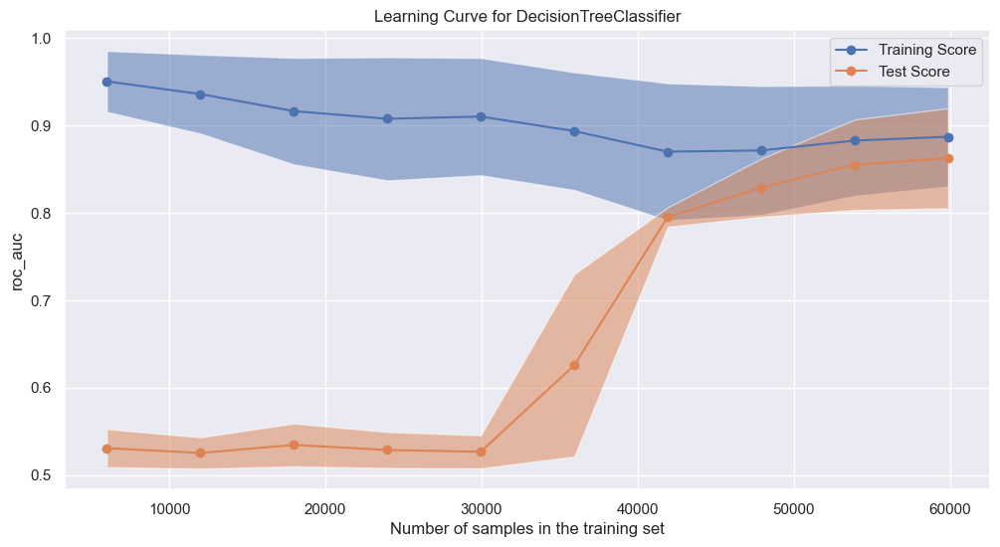

In [71]:
from sklearn.model_selection import LearningCurveDisplay, ShuffleSplit

fig, ax = plt.subplots(figsize=(12,6))

common_params = {
    "X": X,
    "y": y,
    "train_sizes": np.linspace(0.1, 1.0, 10),
    "cv": 3,
    "score_type": "both",
    "n_jobs": 3,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "roc_auc",
}


LearningCurveDisplay.from_estimator(nt, **common_params, ax=ax)
handles, label = ax.get_legend_handles_labels()
ax.legend(handles[:2], ["Training Score", "Test Score"])
ax.set_title(f"Learning Curve for {nt.__class__.__name__}")
plt.show()

При большом объеме данных модель обучается очень хорошо, имеет высокий показатель метрики. Однако есть небольшой зазор, но абсолютные показатели roc_auc показывает маленькие расхождения. Если есть переобучение, то оно невелико. 

In [72]:
nt = DecisionTreeClassifier(criterion='entropy', max_depth=21, max_leaf_nodes=210).fit(X_train, y_train)

## Значимость признаков

In [106]:
impf = {}
for name, importance in zip(X_train.columns, nt.feature_importances_):
    impf[name] = [np.round(importance,3)]
impf = pd.DataFrame(impf).T
impf.columns = ['importance']
impf.sort_values(by='importance', ascending=False)

,importance
NumCreditLines,0.632
LoanTerm,0.136
Age,0.119
InterestRate,0.040
Income,0.028
MonthsEmployed,0.025
LoanAmount,0.014
CreditScore,0.003
DTIRatio,0.002
EmploymentType_Unemployed,0.000


Наиболее влиятельными признаками для выбранной модели оказалось количество кредитных линий, срок кредита, возраст клиента

Очень много незначимых признаков, перестроим модель 

In [122]:
result_data = dataimd.drop(columns = impf[impf['importance']==0].index)
result_data.head()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Default
0,56.0,85994.0,50587.0,520.0,80.0,4.0,15.23,36.0,0.44,0
1,69.0,50432.0,124440.0,458.0,15.0,1.0,4.81,60.0,0.68,0
2,40.0,132784.0,228510.0,480.0,114.0,4.0,9.09,48.0,0.33,0
3,39.0,33015.0,10889.0,811.0,106.0,2.0,13.56,60.0,0.66,0
4,41.0,123419.0,161146.0,376.0,65.0,4.0,16.96,60.0,0.39,0


In [138]:
X, y = result_data.drop(columns='Default'), result_data['Default']

In [139]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)

In [140]:
X_test, X_finish, y_test, y_finish = train_test_split(X_val, y_val, test_size=0.5)

In [141]:
result = cross_validate(DecisionTreeClassifier(), X_train, y_train, cv=5, scoring=['roc_auc','accuracy','precision','recall','f1'],return_train_score=True)
pd.DataFrame(result)

,fit_time,score_time,test_roc_auc,train_roc_auc,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,0.440573,0.019027,0.857539,1.0,0.857570,1.0,0.848358,1.0,0.871563,1.0,0.859804,1.0
1,0.439411,0.014510,0.852606,1.0,0.852630,1.0,0.845850,1.0,0.863232,1.0,0.854453,1.0
2,0.441632,0.016019,0.858375,1.0,0.858405,1.0,0.849452,1.0,0.871980,1.0,0.860569,1.0
3,0.438537,0.015504,0.861730,1.0,0.861745,1.0,0.857339,1.0,0.868648,1.0,0.862956,1.0
4,0.441548,0.018550,0.858709,1.0,0.858743,1.0,0.848215,1.0,0.874601,1.0,0.861206,1.0


Голое дерево не улучшилось после очистки незначимых признаков

In [142]:
result = cross_validate(DecisionTreeClassifier(criterion='entropy', max_depth=21, max_leaf_nodes=210),
                        X_train, y_train,
                        cv=5,
                        scoring=['roc_auc','accuracy','precision','recall','f1'],
                        return_train_score=True)
pd.DataFrame(result)

,fit_time,score_time,test_roc_auc,train_roc_auc,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,0.456849,0.016803,0.924782,0.938884,0.877331,0.886914,0.958832,0.965912,0.789086,0.802652,0.865717,0.876747
1,0.454213,0.015513,0.926801,0.944258,0.881784,0.892602,0.960811,0.968650,0.796584,0.811955,0.871024,0.883408
2,0.452026,0.014533,0.931977,0.941724,0.888185,0.887975,0.967419,0.969796,0.803943,0.801402,0.878138,0.877594
3,0.444405,0.016019,0.926899,0.941474,0.883106,0.889158,0.967966,0.974895,0.792974,0.799389,0.871775,0.878462
4,0.449170,0.015508,0.927207,0.942168,0.882124,0.889107,0.959299,0.965203,0.798639,0.807831,0.871628,0.879533


In [143]:
nt = DecisionTreeClassifier(criterion='entropy', max_depth=21, max_leaf_nodes=210).fit(X_train, y_train)

In [144]:
print(f'roc_auc_score на тренировочных данных {roc_auc_score(y_train, nt.predict(X_train))}')

roc_auc_score на тренировочных данных 0.8900333656706698


In [145]:
print(f'roc_auc_score на тестовых данных {roc_auc_score(y_test, nt.predict(X_test))}')

roc_auc_score на тестовых данных 0.8868868261753077


In [146]:
print(f'roc_auc_score на окончательных данных {roc_auc_score(y_finish, nt.predict(X_finish))}')

roc_auc_score на окончательных данных 0.8804308105280731


Метрики остались такими же, так как алгоритм для незначимых коэффициентов ставил 0

## Результаты

В итоге удалось построить модель для бинарной классификации с максимально похожими условиями внутри банковской организации. 

Дерево принятия решения выглядит так

In [159]:
fig, ax = plt.subplots(figsize=(40, 15), dpi=750)
plot_tree(nt, feature_names=X_train.columns, ax=ax, fontsize=1)
plt.savefig('tree.png')
plt.show()

К сожалению его необходимо рассматривать не в ноутбуке, а в отдельном приложением к работе, так как оно получилось крупным и его необходимо приближать. 

По итогу получилась модель с метрикой auc_roc = 0.88.

Она оценивает компромисс между частотой истинных и ложных положительных результатов при различных пороговых значениях классификации. Для бизнеса эта метрика расшифровывается насколько модель хорошо отличает хорошего и плохого клиента. Метрика поможет бизнесу построить математическое ожидание доходности клиента и уже на основе этого принимать решение стоит ли давать ему кредит. 

В реальности банку необходимо заново проделывать похожую работу, так как датасет может не являться репрезентативным для их клиентов. 